<a href="https://colab.research.google.com/github/ksp7273/Object-Detection-with-DETr/blob/main/detr_object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Object Detection with DETr

Created by Facebook Research, DETr is an object detection model that replaces the object detection pipeline with a Transformer. Learn more about [DETr here](https://github.com/facebookresearch/detr) at the official repository..

In [1]:
import torch
import torchvision
from torchvision import transforms as T
from torchvision.utils import draw_bounding_boxes # bounding box drawing function.
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
CLASSES = [
    'N/A', 'person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus',
    'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'N/A',
    'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse',
    'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'N/A', 'backpack',
    'umbrella', 'N/A', 'N/A', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis',
    'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove',
    'skateboard', 'surfboard', 'tennis racket', 'bottle', 'N/A', 'wine glass',
    'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich',
    'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake',
    'chair', 'couch', 'potted plant', 'bed', 'N/A', 'dining table', 'N/A',
    'N/A', 'toilet', 'N/A', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
    'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'N/A',
    'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier',
    'toothbrush'
] # COCO Classes
# These variables are for loading for pytorch hub
MODEL_REPO = "facebookresearch/detr:main" # The model repo
MODEL_NAME = "detr_resnet50" # The model

In [3]:
# Load an image of around 10 cars.
!wget -O car.jpg https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg

--2022-12-15 05:14:28--  https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/10best-cars-group-cropped-1542126037.jpg
Resolving hips.hearstapps.com (hips.hearstapps.com)... 151.101.0.155, 151.101.64.155, 151.101.128.155, ...
Connecting to hips.hearstapps.com (hips.hearstapps.com)|151.101.0.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2178423 (2.1M) [image/jpeg]
Saving to: ‘car.jpg’

car.jpg             100%[===================>]   2.08M  --.-KB/s    in 0.06s   

2022-12-15 05:14:28 (32.8 MB/s) - ‘car.jpg’ saved [2178423/2178423]



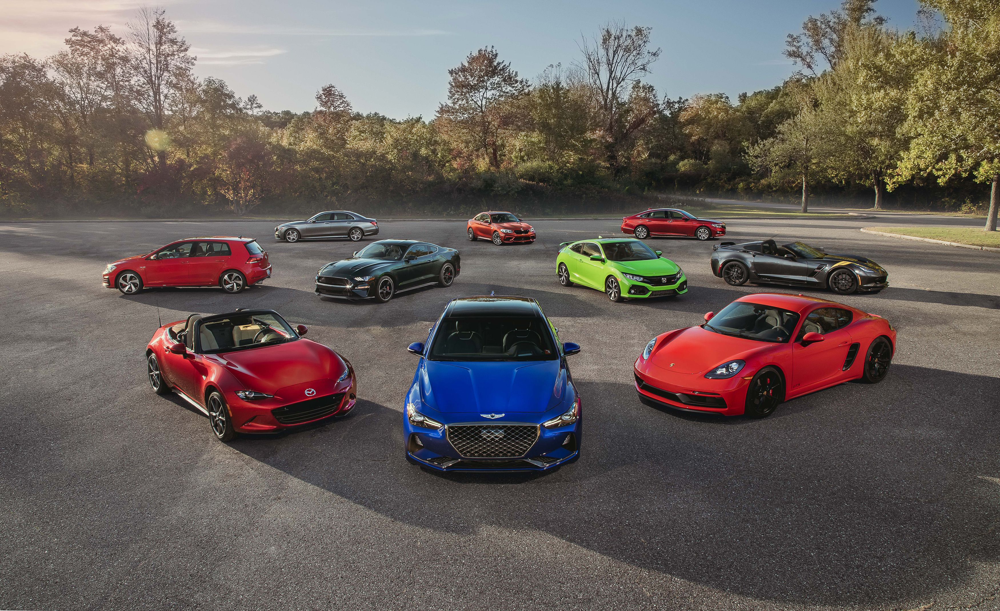

In [4]:
im = Image.open("car.jpg")
im

In [5]:
def box_cxcywh_to_xyxy(x):
  """
  This is to convert the bounding boxes from DETr format to xy coordiante pairs
  """
  x_c, y_c, w, h = x.unbind(1)
  b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
       (x_c + 0.5 * w), (y_c + 0.5 * h)]
  return torch.stack(b, dim=1)


In [6]:
def rescale_boxes(out_bbox, size):
  """
  Rescale the bounding boxes to the original image height and width so they can be overlaid.
  """
  img_w, img_h = size
  b = box_cxcywh_to_xyxy(out_bbox)
  b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
  return b


In [7]:
transforms = T.Compose([
    T.Resize(800), # Resizes too 800px while maintaing the aspect ratio
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # Imagenet normalization
])

In [8]:
img = transforms(im).unsqueeze(0)

In [9]:
model = torch.hub.load(MODEL_REPO, MODEL_NAME, pretrained=True)

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cache/torch/hub/checkpoints/detr-r50-e632da11.pth


  0%|          | 0.00/159M [00:00<?, ?B/s]

In [10]:
model = model.eval()

In [11]:
out = model(img)

In [12]:
probs = out["pred_logits"].softmax(-1)[0, :, :-1] # processing output to return bounding boxes and labels
keep = probs.max(-1).values > 0.7 # only predictions with 0.7 probability or higher
bboxes_scaled = rescale_boxes(out['pred_boxes'][0, keep], im.size)

In [13]:
labels = [CLASSES[i] for i in probs[keep].argmax(1)] # This is a good sign, the model detected many cars
labels

['car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car', 'car']

In [14]:
tensor_img = torch.tensor((T.ToTensor()(im) * 255), dtype=torch.uint8) # draw_bounding_boxes requires images in this format.

<ipython-input-14-4645be732204>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_img = torch.tensor((T.ToTensor()(im) * 255), dtype=torch.uint8) # draw_bounding_boxes requires images in this format.


In [15]:
bb = draw_bounding_boxes(tensor_img, boxes=bboxes_scaled, width=6) # this function will automatically overlay bounding boxes over the image
# imported at beginning of file

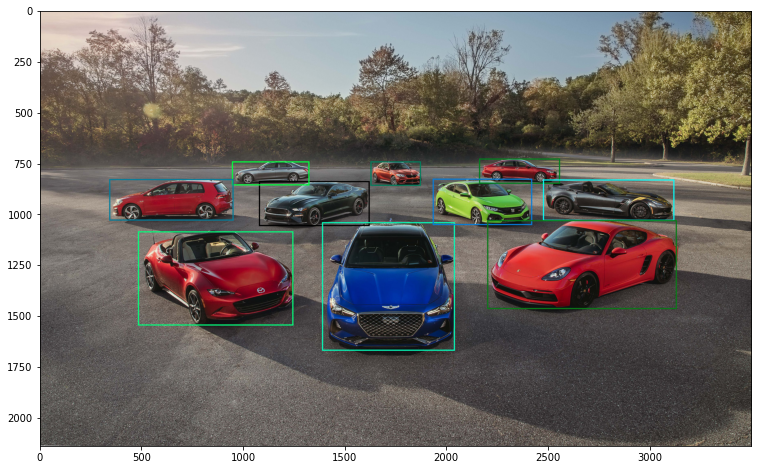

In [16]:
# draw figure
fig = plt.figure(figsize=(14, 8))
plt.imshow(bb.permute(1, 2, 0)) # convert it into a image that matplotlib can display

In [ ]:
# You can see that the model correctly predicted all the cars. The bounding boxes are very accurate.
# Thats it for this video, i will see you next time.